<a href="https://colab.research.google.com/github/RodolpheKouyoumdjian/StocksCorrelation/blob/main/Stocks_correlations_by_industry.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Is the performance of publically listed companies in the same industry correlated ? 

In this project, we will analyse correlations between various companiew and analyse the data obtained.

In [ ]:
!pip install yfinance

In [ ]:
# Required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import yfinance as yf
from datetime import datetime
from pandas.core.frame import DataFrame
from scipy.stats import pearsonr
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from scipy.spatial.distance import squareform

In [ ]:
# Execution time
start_time = datetime.now()

In [ ]:
# Functions

# Returns all stock symbols of the same industry
def industrySort(companiesData, industry):
  return list(companiesData[companiesData['GICS Sector'] == industry]['Symbol'])

# Returns the entire price history of a given list of stocks
def downloadPrices(tickers):
  return yf.download(tickers, period='max')['Open'].pct_change().dropna(how='any') + 1

# Find the Pearson r correlation coefficient
def findCorrelation(stock1, stock2):
  return pearsonr(stock1, stock2)[0]

In [ ]:
# Get all S&P 500 listed companies from Wikipedia
companiesData = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')[0]

# List of all different industries
industries = list(set(companiesData['GICS Sector']))

[*********************100%***********************]  30 of 30 completed
Real Estate stocks ranked in descending order of correlation with other stocks
                 City State / Province        Country          Sub-Industry  Dividend Market Cap
SBAC       Boca Raton               FL  United States     Specialized REITs     False    Big-cap
CCI           Houston               TX  United States     Specialized REITs     False    Big-cap
AMT            Boston               MA  United States     Specialized REITs     False    Big-cap
EQIX     Redwood City               CA  United States     Specialized REITs     False    Big-cap
IRM            Boston               MA  United States     Specialized REITs     False    Big-cap
WY            Seattle               WA  United States     Specialized REITs     False    Big-cap
CBRE           Dallas               TX  United States  Real Estate Services     False    Big-cap
EQR           Chicago               IL  United States     Residential REIT

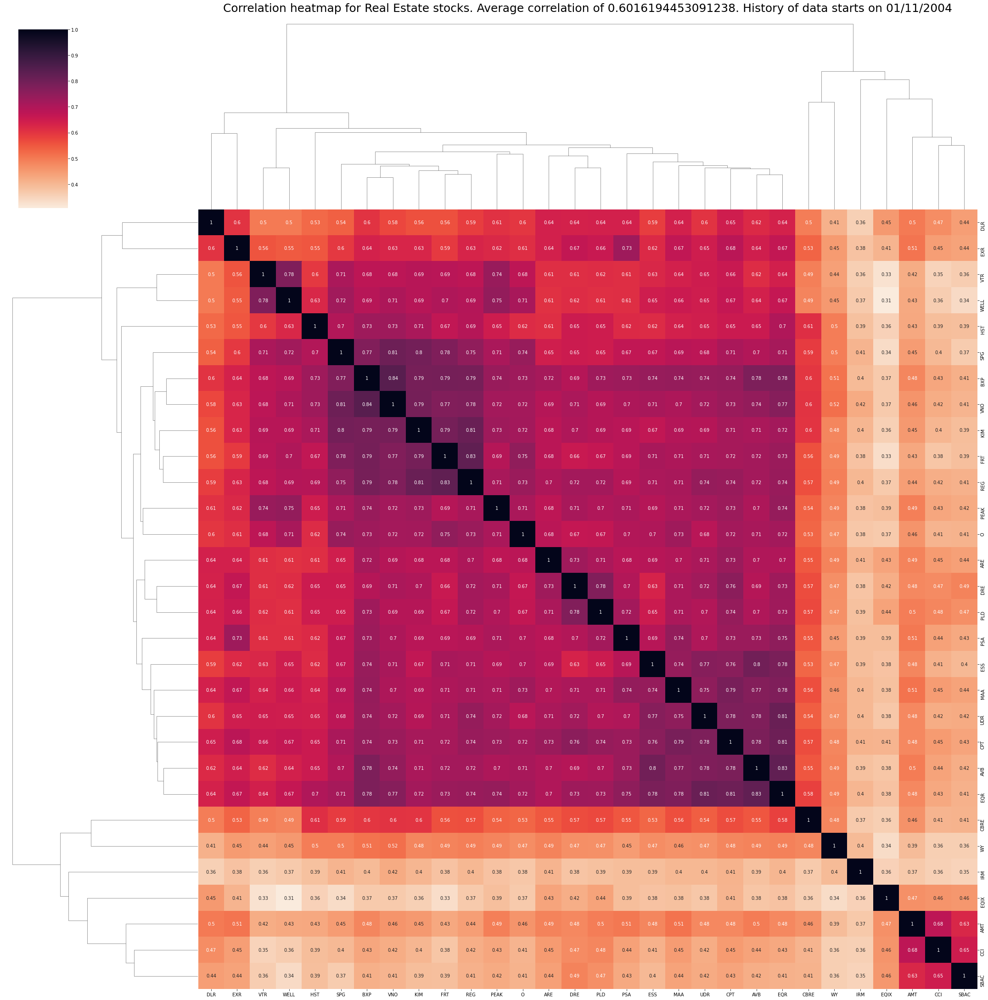

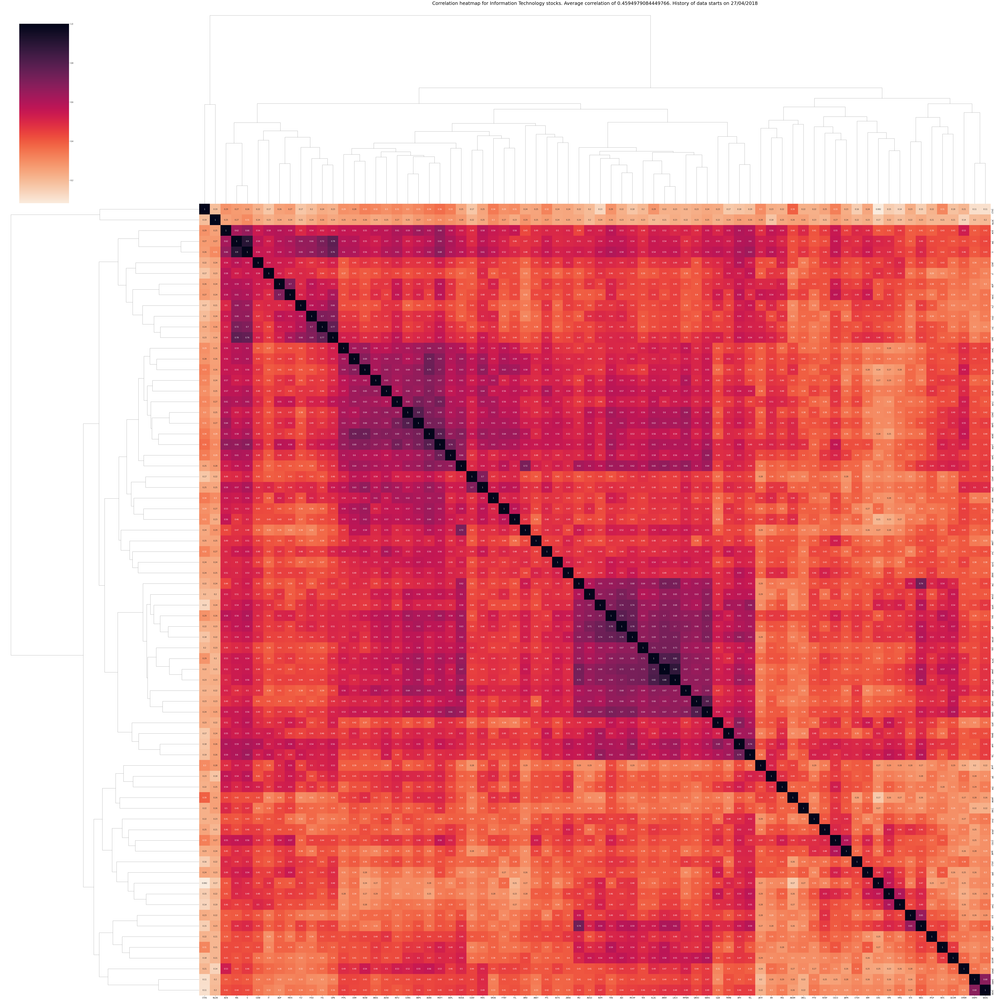

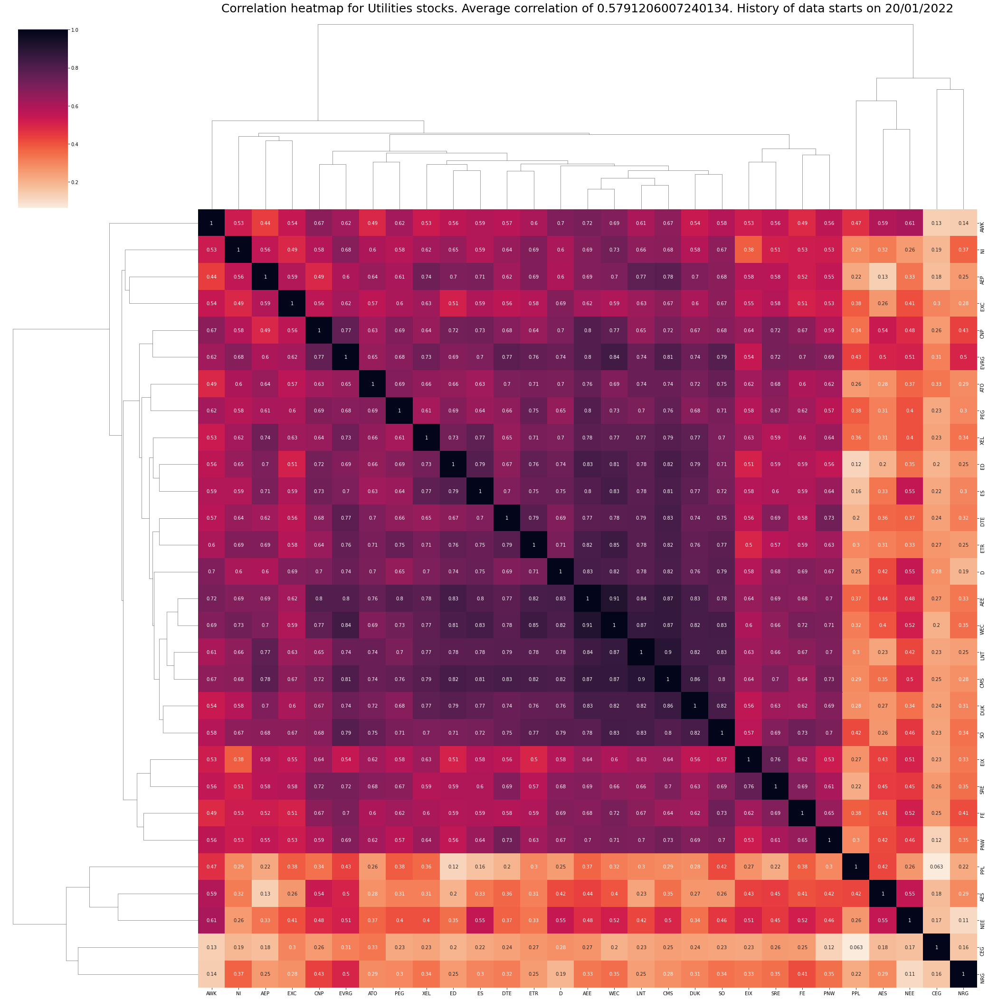

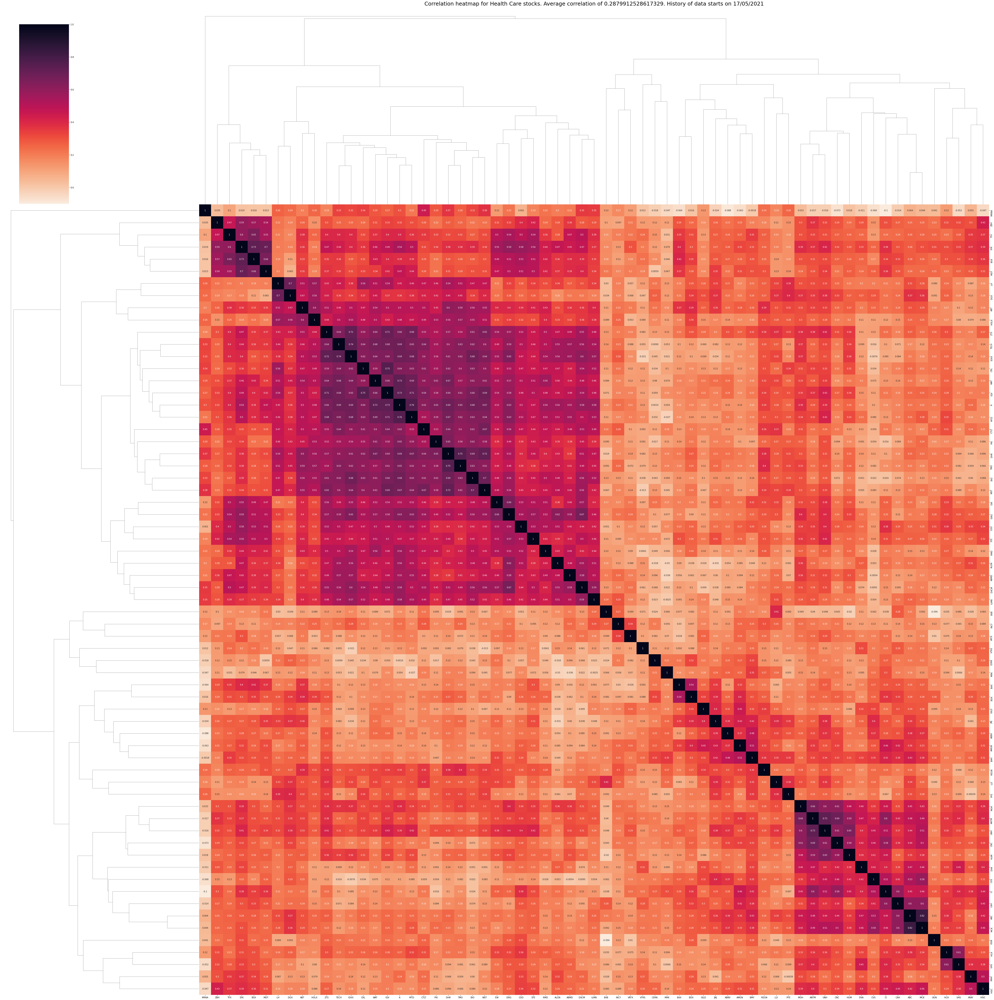

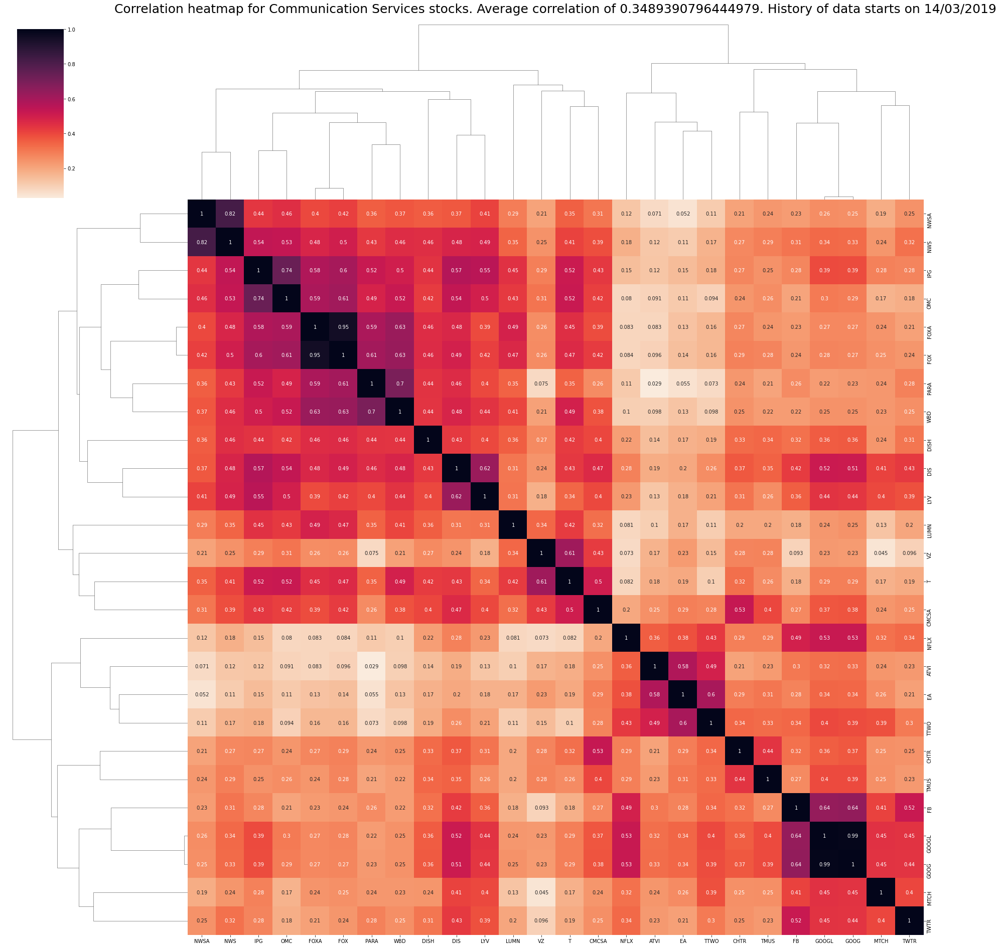

...

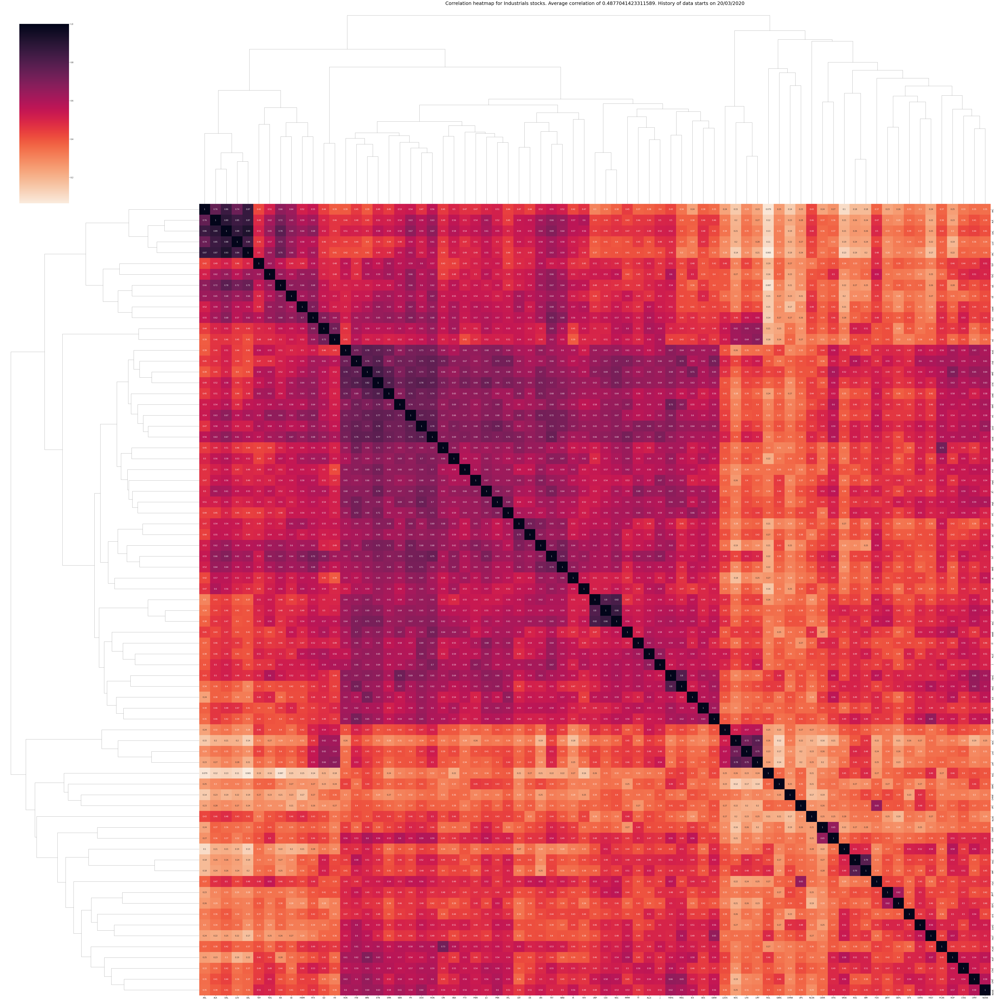

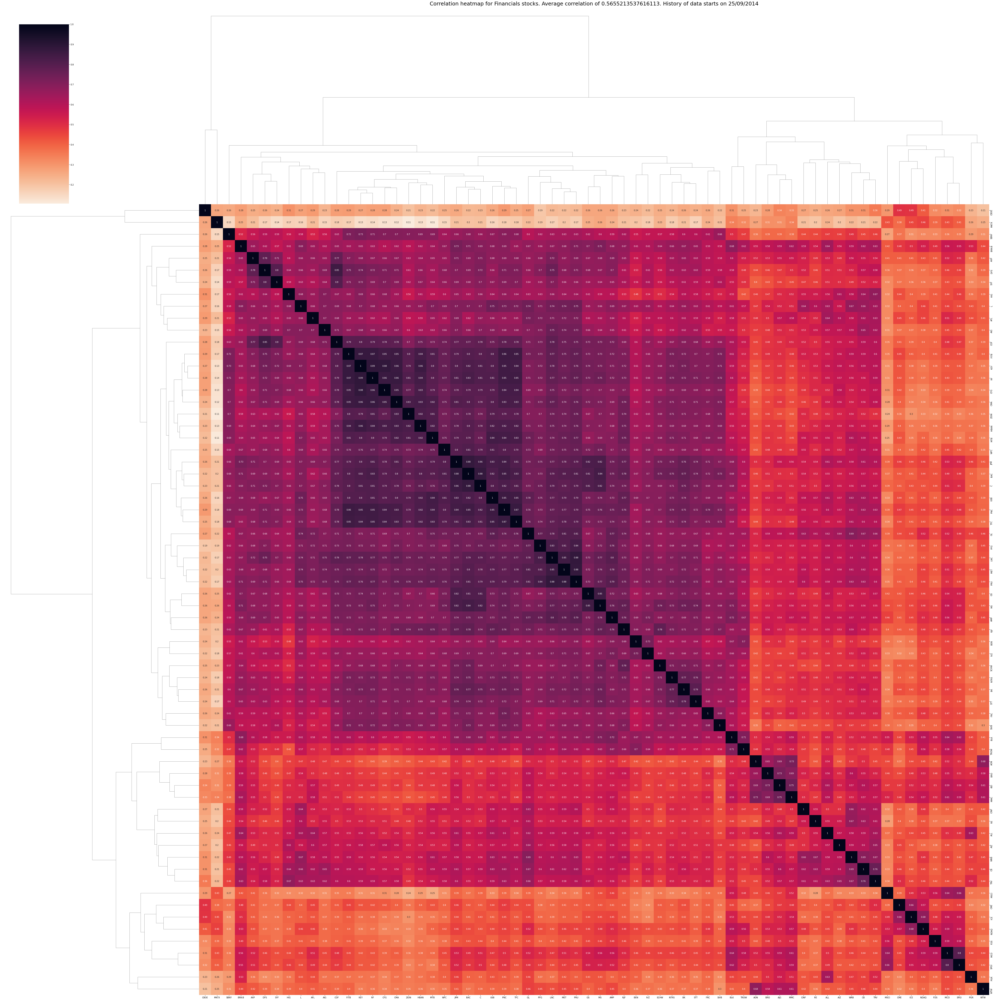

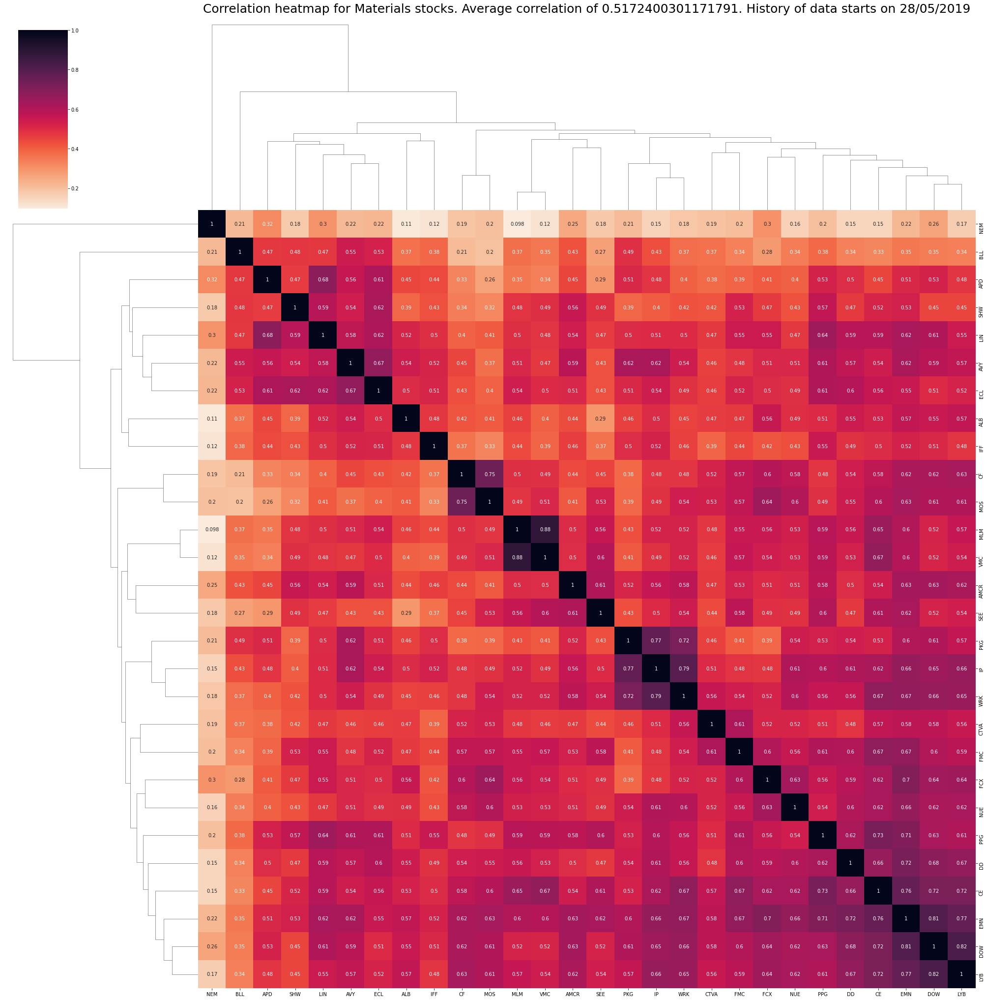

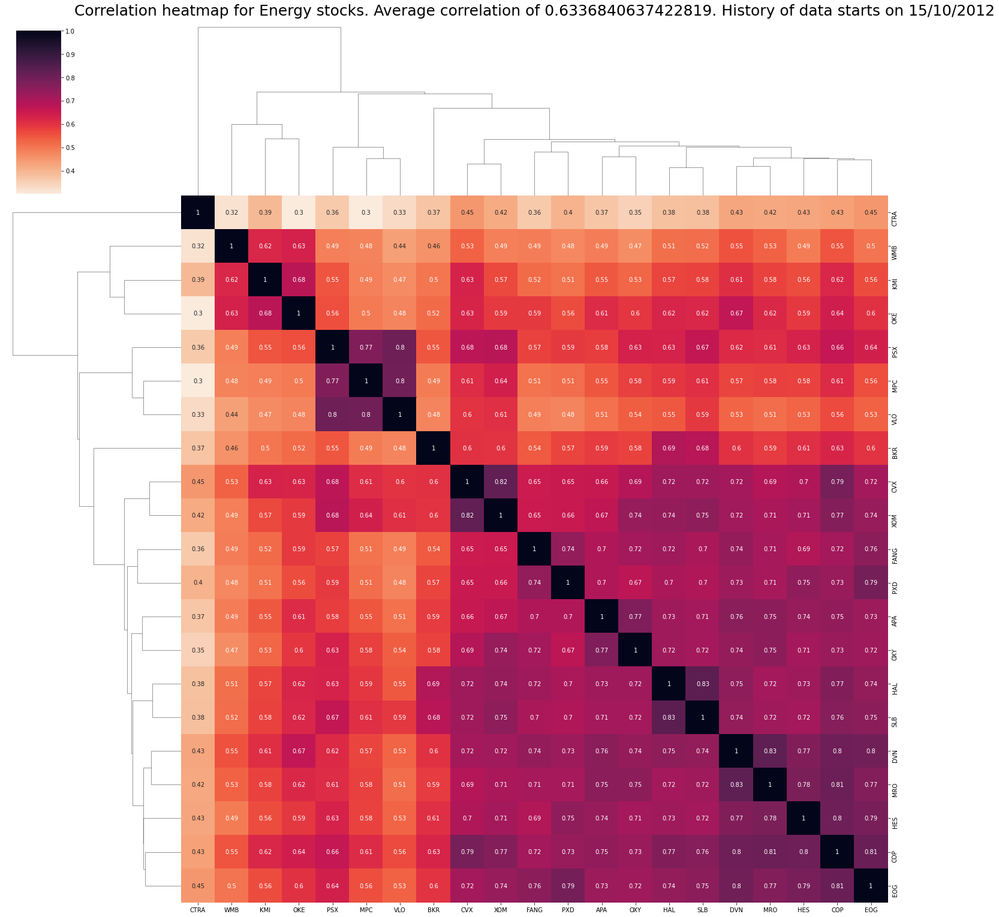

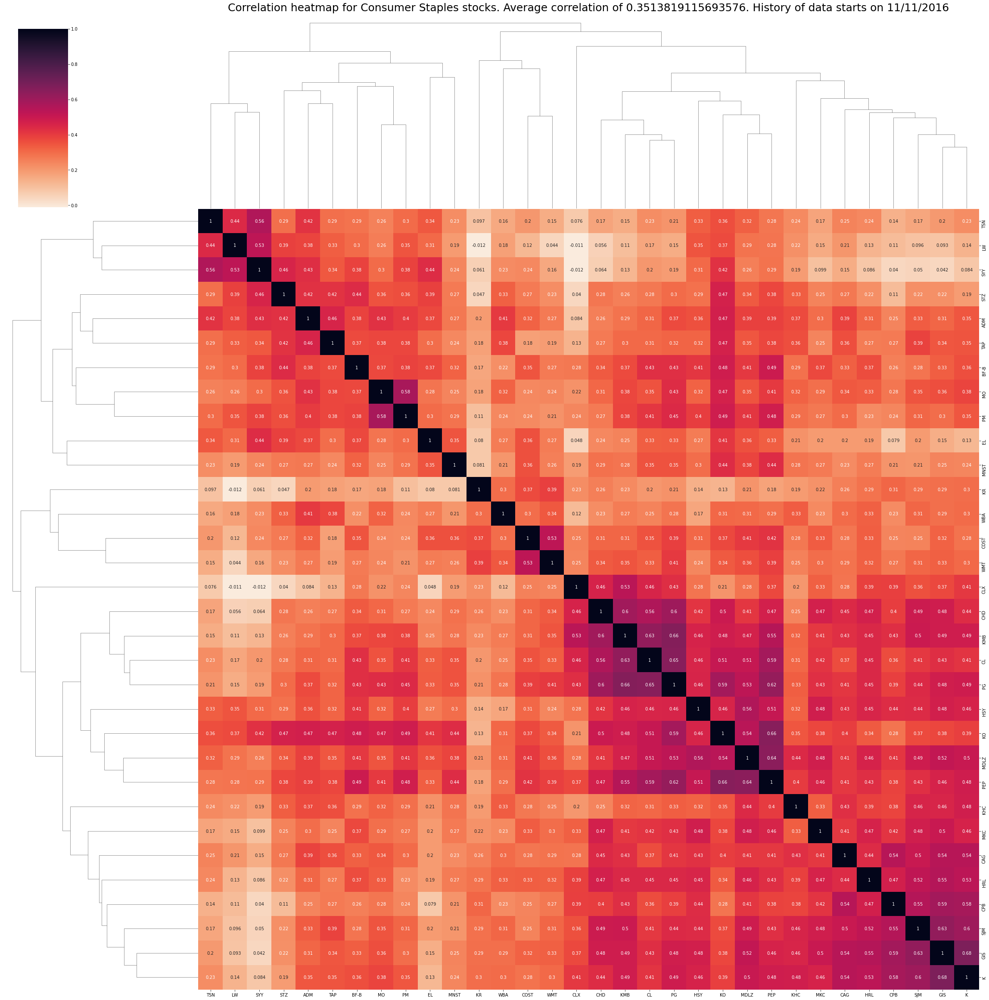

In [ ]:
# Replace symbols containing '.' by '-' because the notation of Wikipedia uses the former while Yahoo Finance uses the latter

for i in industries:
  tickers = [t.replace('.', '-') for t in industrySort(companiesData, i)]
  openPrices = downloadPrices(tickers)
  number_of_companies = len(tickers)

  # Correlation of array that will contain the pearson r correlation coefficient of each company pair
  correlation = np.array([])

  # Loop that will append to the correlation array each individual correlation value
  for ticker1 in tickers:
    stock1 = openPrices[ticker1]
    for ticker2 in tickers:
      correlation = np.append(correlation, pearsonr(stock1, openPrices[ticker2])[0])

  avg_correlation = np.mean(correlation)
  mean_corr_dict = {}

  # Cluster heatmap 
  correlation = np.reshape(correlation, (number_of_companies, number_of_companies))
  df = pd.DataFrame(correlation, columns=tickers, index=tickers)
  graph = sns.clustermap(df, annot=True, cmap='rocket_r', figsize=(number_of_companies, number_of_companies))
  graph.ax_col_dendrogram.set_title(f'Correlation heatmap for {i} stocks. Average correlation of {avg_correlation}. History of data starts on ' + openPrices.index[0].strftime('%d/%m/%Y'), fontsize=25) 

  # Dataframe to see similarities between each company
  reorderedIndices = np.array(graph.dendrogram_row.reordered_ind)
  reorderedSymbols = np.array(tickers)[reorderedIndices][::-1]
  reorderedSubIndustries = np.array(companiesData[companiesData['GICS Sector'] == i]['GICS Sub-Industry'])[reorderedIndices][::-1]
  cities, states, countries, dividend, market_cap = np.array([]), np.array([]), np.array([]), np.array([]), np.array([])
  
  for s in reorderedSymbols:
    companyInfo = yf.Ticker(s).info

    try:
      cities = np.append(cities, companyInfo['city'])
    except:  
      cities = np.append(cities, 'N/A')

    try:
      states = np.append(states, companyInfo['state'])
    except:  
      states = np.append(states, 'N/A')

    try:
      countries = np.append(countries, companyInfo['country'])
    except:  
      countries = np.append(countries, 'N/A')

    try:
      dividend = np.append(dividend, companyInfo['lastDividendValue'])
    except:  
      dividend = np.append(dividend, False)
    
    try:
      market_cap = np.append(market_cap, companyInfo['marketCap'])
    except:  
      dividend = np.append(market_cap, 0)
      
  dividend = dividend!=None
  mc_copy = market_cap
  market_cap[mc_copy == None] = 0
  market_cap = market_cap.astype(str)

  market_cap[mc_copy == 0] = 'N/A'
  market_cap[(mc_copy > 0) & (mc_copy < (50 * 10 ** 6))] = 'Nano-cap'
  market_cap[(mc_copy >= (50 * 10 ** 6)) & (mc_copy < (300 * 10 ** 6))] = 'Micro-cap'
  market_cap[(mc_copy >= (300 * 10 ** 6)) & (mc_copy < (2 * 10 ** 9))] = 'Small-cap'
  market_cap[(mc_copy >= (2 * 10 ** 9)) & (mc_copy < (10 * 10 ** 9))] = 'Mid-cap'
  market_cap[(mc_copy >= (10 * 10 ** 9)) & (mc_copy < (200 * 10 ** 9))] = 'Big-cap'
  market_cap[(mc_copy >= (200 * 10 ** 9))] = 'Mega-cap'

  dfData = {'City': cities, 'State / Province': states, 'Country': countries, 'Sub-Industry': reorderedSubIndustries,'Dividend': dividend, 'Market Cap': market_cap}
  companySimilarities = pd.DataFrame(data=dfData, index=reorderedSymbols)
  print(i + ' stocks ranked in descending order of correlation with other stocks')
  print(companySimilarities.to_string())

In [ ]:
# Execution time
end_time = datetime.now()
print('Execution time: {}'.format(end_time - start_time))

Execution time: 1:41:08.120128


Observations from results:

With the clustermap, it becomes clear that clumps are formed. This is most obvious in the clustermap of Health Care stocks. We can see three big groups formed on the heatmap. On the dataframes, we can see that successive rows in the dataframe share most characteristics. There are clumps that stick together rather than random alternations between data. This suggests that hierarchical clustering in stocks of the same industry is directly affected by characteristics of the company such as its subindustry, if it pays a dividend or not and its market cap. There is a bit more randomness in the location of the company (state / city), suggesting that a company's location is not relevant to its peformance. One last interesting observation is that we do not observe mega-cap stocks on the extremes of the clustermap, we observe them in the center (exception with communication services stocks). All other industries mostly have big-caps and some mega-caps on the extremes. 